In [1]:
import layoutparser as lp
import cv2

# 1. Extract Texts and Figures

## define parameters

In [2]:
imagepath = '/home/lstm/Github/pdf2html/repo-layout-parser/examples/data/paper-image.jpg'
image = cv2.cvtColor(cv2.imread(imagepath), cv2.COLOR_BGR2RGB)  # read image and convert to RGB
    # image[..., ::-1] also works

## get image dimension

In [3]:
print(image.shape)
h, w, d = image.shape

(1650, 1275, 3)


## set up LP model

In [4]:
model = lp.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',
                                 extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})

# model = lp.AutoLayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',
#                                  extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
#                                  label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})

# model = ld.PaddleOCRLayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',

# Model Zoo: https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html

/home/lstm/miniconda3/envs/pdf2html/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## detect layout

In [5]:
model

In [6]:
layout = model.detect(image)  # detect layout

/home/lstm/miniconda3/envs/pdf2html/lib/python3.9/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/home/lstm/miniconda3/envs/pdf2html/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180487213/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


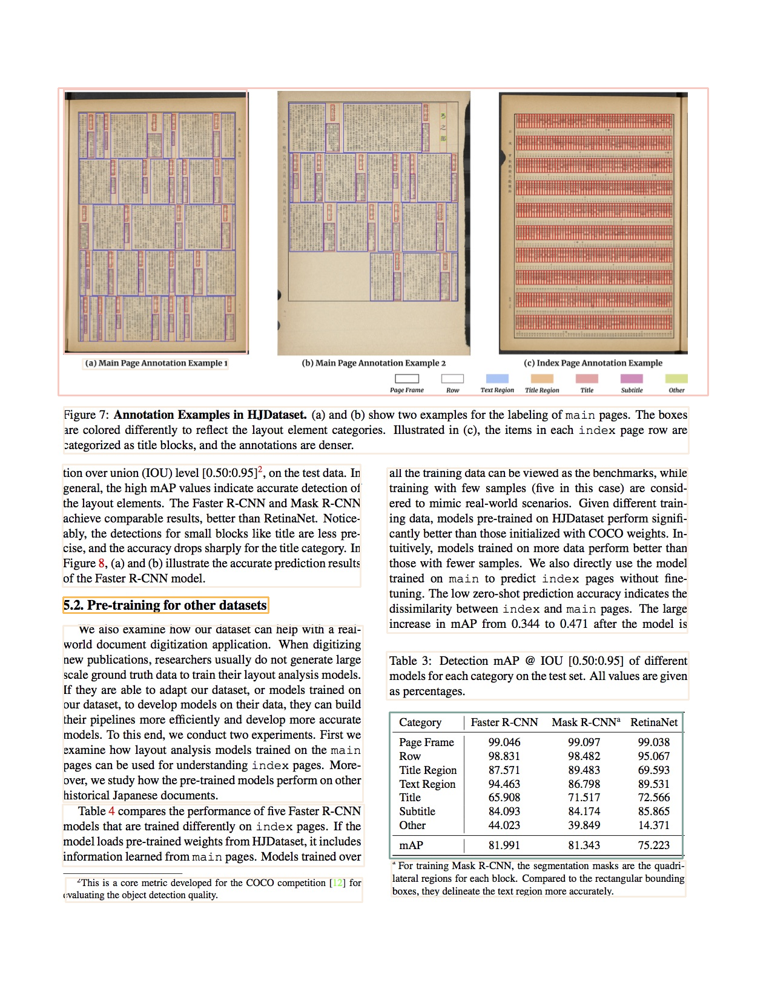

In [7]:
lp.draw_box(image, layout, box_width=3)  # Show the detected layout of the input image

In [8]:
layout

Layout(_blocks=[TextBlock(block=Rectangle(x_1=646.4182739257812, y_1=1420.1715087890625, x_2=1132.8687744140625, y_2=1479.7222900390625), text=None, id=None, type=Text, parent=None, next=None, score=0.9996440410614014), TextBlock(block=Rectangle(x_1=104.67259979248047, y_1=1032.2186279296875, x_2=599.1764526367188, y_2=1323.75244140625), text=None, id=None, type=Text, parent=None, next=None, score=0.9980862140655518), TextBlock(block=Rectangle(x_1=639.8294677734375, y_1=772.9141235351562, x_2=1135.684326171875, y_2=1044.6287841796875), text=None, id=None, type=Text, parent=None, next=None, score=0.9973709583282471), TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=None, id=None, type=Text, parent=None, next=None, score=0.9966327548027039), TextBlock(block=Rectangle(x_1=108.64065551757812, y_1=1448.55517578125, x_2=598.8385620117188, y_2=1488.103759765625), text=None, id=None, type=Text, parent=None, next=None, s

In [9]:
layout._blocks

[TextBlock(block=Rectangle(x_1=646.4182739257812, y_1=1420.1715087890625, x_2=1132.8687744140625, y_2=1479.7222900390625), text=None, id=None, type=Text, parent=None, next=None, score=0.9996440410614014),
 TextBlock(block=Rectangle(x_1=104.67259979248047, y_1=1032.2186279296875, x_2=599.1764526367188, y_2=1323.75244140625), text=None, id=None, type=Text, parent=None, next=None, score=0.9980862140655518),
 TextBlock(block=Rectangle(x_1=639.8294677734375, y_1=772.9141235351562, x_2=1135.684326171875, y_2=1044.6287841796875), text=None, id=None, type=Text, parent=None, next=None, score=0.9973709583282471),
 TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=None, id=None, type=Text, parent=None, next=None, score=0.9966327548027039),
 TextBlock(block=Rectangle(x_1=108.64065551757812, y_1=1448.55517578125, x_2=598.8385620117188, y_2=1488.103759765625), text=None, id=None, type=Text, parent=None, next=None, score=0.9950

In [10]:
dir(layout)

['__abstractmethods__',
 '__add__',
 '__class__',
 '__class_getitem__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_blocks',
 'append',
 'clear',
 'condition_on',
 'copy',
 'count',
 'crop_image',
 'extend',
 'filter_by',
 'get_homogeneous_blocks',
 'get_info',
 'get_texts',
 'index',
 'insert',
 'is_in',
 'pad',
 'page_data',
 'pop',
 'relative_to',
 'remove',
 'reverse',
 'scale',
 'shift',
 'sort',
 'to_dataframe',
 'to_dict']

## remove blocks enclosed by anothe block & display

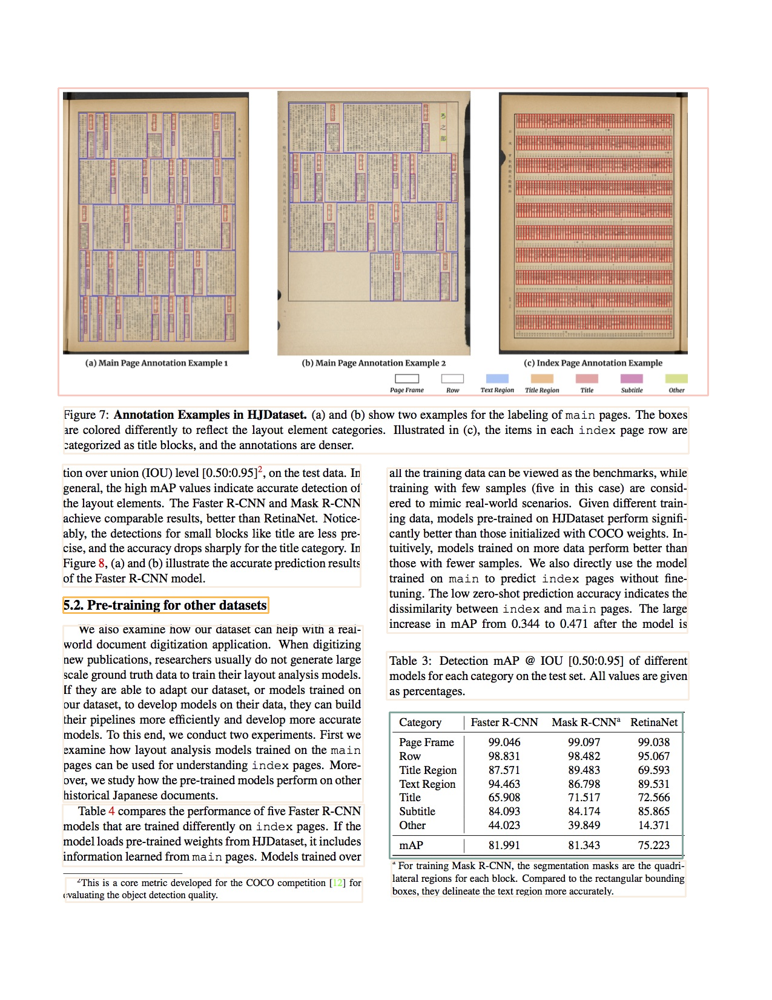

In [11]:

# text_blocks = lp.Layout([b for b in text_blocks if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

block_to_remove = []
for block in layout:
    for another_block in layout:
        if block is another_block:
            continue
        else:
            if block.is_in(another_block):                
                block_to_remove.append(block)

for block in block_to_remove:
    layout.remove(block)

lp.draw_box(image, layout, box_width=3)

## get blocks from layout and group by type

In [12]:
block_types = set([b.type for b in layout])

In [13]:
text_blocks = lp.Layout([b for b in layout if b.type=='Text'])
figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])
table_blocks = lp.Layout([b for b in layout if b.type=='Table'])
title_blocks = lp.Layout([b for b in layout if b.type=='Title'])

## get "interval" of left text column (layout object along one axis of canvas)

In [14]:
left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)
# right_interval = lp.Interval(w/2*0.95, w, axis='x').put_on_canvas(image)
left_interval

Interval(start=0, end=669.375, axis=x, canvas_height=1650, canvas_width=1275)

In [15]:
dir(left_interval)

['__abstractmethods__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slotnames__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_features',
 '_name',
 'area',
 'axis',
 'canvas_height',
 'canvas_width',
 'center',
 'condition_on',
 'coordinates',
 'crop_image',
 'end',
 'from_dict',
 'height',
 'intersect',
 'is_in',
 'pad',
 'points',
 'put_on_canvas',
 'relative_to',
 'scale',
 'set',
 'shift',
 'start',
 'to_dict',
 'to_quadrilateral',
 'to_rectangle',
 'union',
 'width']

## select text blocks overlapping with left_interval

In [16]:
left_blocks = text_blocks.filter_by(left_interval, center=True)  # filter_by takes in partially overlapping areas
left_blocks._blocks

[TextBlock(block=Rectangle(x_1=104.67259979248047, y_1=1032.2186279296875, x_2=599.1764526367188, y_2=1323.75244140625), text=None, id=None, type=Text, parent=None, next=None, score=0.9980862140655518),
 TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=None, id=None, type=Text, parent=None, next=None, score=0.9966327548027039),
 TextBlock(block=Rectangle(x_1=108.64065551757812, y_1=1448.55517578125, x_2=598.8385620117188, y_2=1488.103759765625), text=None, id=None, type=Text, parent=None, next=None, score=0.9950971007347107),
 TextBlock(block=Rectangle(x_1=105.43914794921875, y_1=671.7182006835938, x_2=1137.5936279296875, y_2=748.4442138671875), text=None, id=None, type=Text, parent=None, next=None, score=0.9950841069221497),
 TextBlock(block=Rectangle(x_1=103.43268585205078, y_1=1327.6221923828125, x_2=601.0582275390625, y_2=1429.9608154296875), text=None, id=None, type=Text, parent=None, next=None, score=0.995

## sort left blocks in order of upper left coordinate

In [17]:
left_blocks = left_blocks.sort(key = lambda b:b.coordinates[1])  
left_blocks._blocks

[TextBlock(block=Rectangle(x_1=105.43914794921875, y_1=671.7182006835938, x_2=1137.5936279296875, y_2=748.4442138671875), text=None, id=None, type=Text, parent=None, next=None, score=0.9950841069221497),
 TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=None, id=None, type=Text, parent=None, next=None, score=0.9966327548027039),
 TextBlock(block=Rectangle(x_1=104.67259979248047, y_1=1032.2186279296875, x_2=599.1764526367188, y_2=1323.75244140625), text=None, id=None, type=Text, parent=None, next=None, score=0.9980862140655518),
 TextBlock(block=Rectangle(x_1=103.43268585205078, y_1=1327.6221923828125, x_2=601.0582275390625, y_2=1429.9608154296875), text=None, id=None, type=Text, parent=None, next=None, score=0.9950313568115234),
 TextBlock(block=Rectangle(x_1=108.64065551757812, y_1=1448.55517578125, x_2=598.8385620117188, y_2=1488.103759765625), text=None, id=None, type=Text, parent=None, next=None, score=0.995

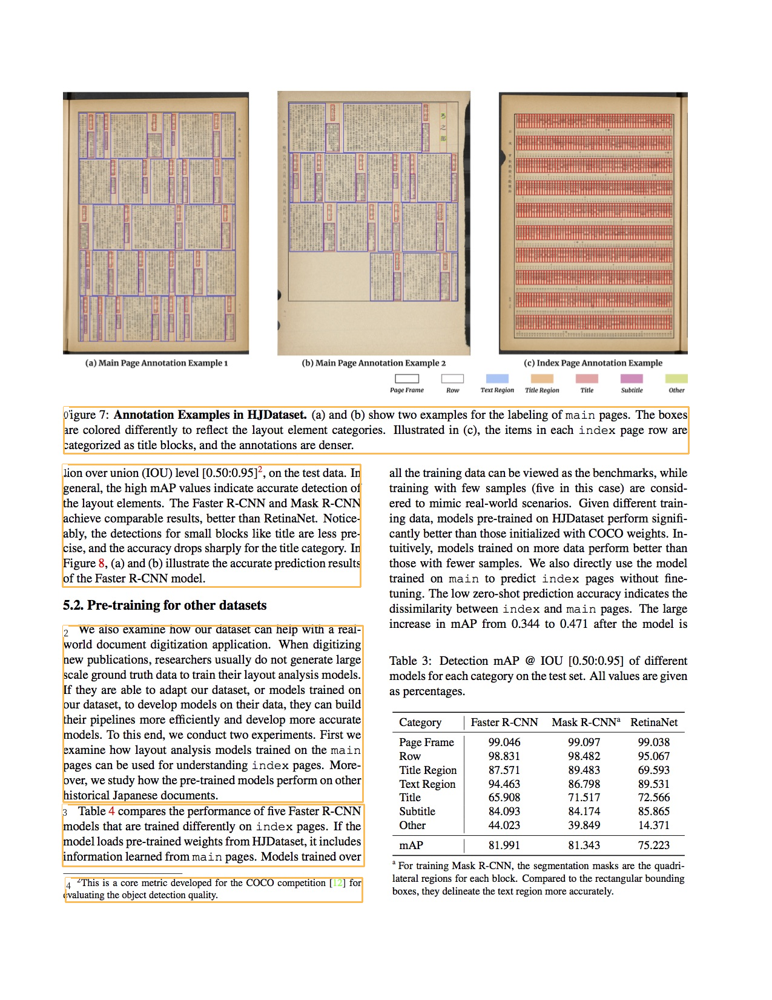

In [18]:
lp.draw_box(image, left_blocks,
            box_width=3,
            show_element_id=True)

## get right blocks and sort

In [19]:
right_blocks = lp.Layout([b for b in text_blocks if b not in left_blocks])
right_blocks = right_blocks.sort(key = lambda b:b.coordinates[1])  # sort in order of upper left coordinate
right_blocks._blocks

[TextBlock(block=Rectangle(x_1=639.8294677734375, y_1=772.9141235351562, x_2=1135.684326171875, y_2=1044.6287841796875), text=None, id=None, type=Text, parent=None, next=None, score=0.9973709583282471),
 TextBlock(block=Rectangle(x_1=638.7540893554688, y_1=1075.3597412109375, x_2=1137.2435302734375, y_2=1154.6163330078125), text=None, id=None, type=Text, parent=None, next=None, score=0.9640974402427673),
 TextBlock(block=Rectangle(x_1=646.4182739257812, y_1=1420.1715087890625, x_2=1132.8687744140625, y_2=1479.7222900390625), text=None, id=None, type=Text, parent=None, next=None, score=0.9996440410614014)]

## combine left and right text blocks and display

[TextBlock(block=Rectangle(x_1=105.43914794921875, y_1=671.7182006835938, x_2=1137.5936279296875, y_2=748.4442138671875), text=None, id=0, type=Text, parent=None, next=None, score=0.9950841069221497), TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=None, id=1, type=Text, parent=None, next=None, score=0.9966327548027039), TextBlock(block=Rectangle(x_1=104.67259979248047, y_1=1032.2186279296875, x_2=599.1764526367188, y_2=1323.75244140625), text=None, id=2, type=Text, parent=None, next=None, score=0.9980862140655518), TextBlock(block=Rectangle(x_1=103.43268585205078, y_1=1327.6221923828125, x_2=601.0582275390625, y_2=1429.9608154296875), text=None, id=3, type=Text, parent=None, next=None, score=0.9950313568115234), TextBlock(block=Rectangle(x_1=108.64065551757812, y_1=1448.55517578125, x_2=598.8385620117188, y_2=1488.103759765625), text=None, id=4, type=Text, parent=None, next=None, score=0.9950971007347107), Tex

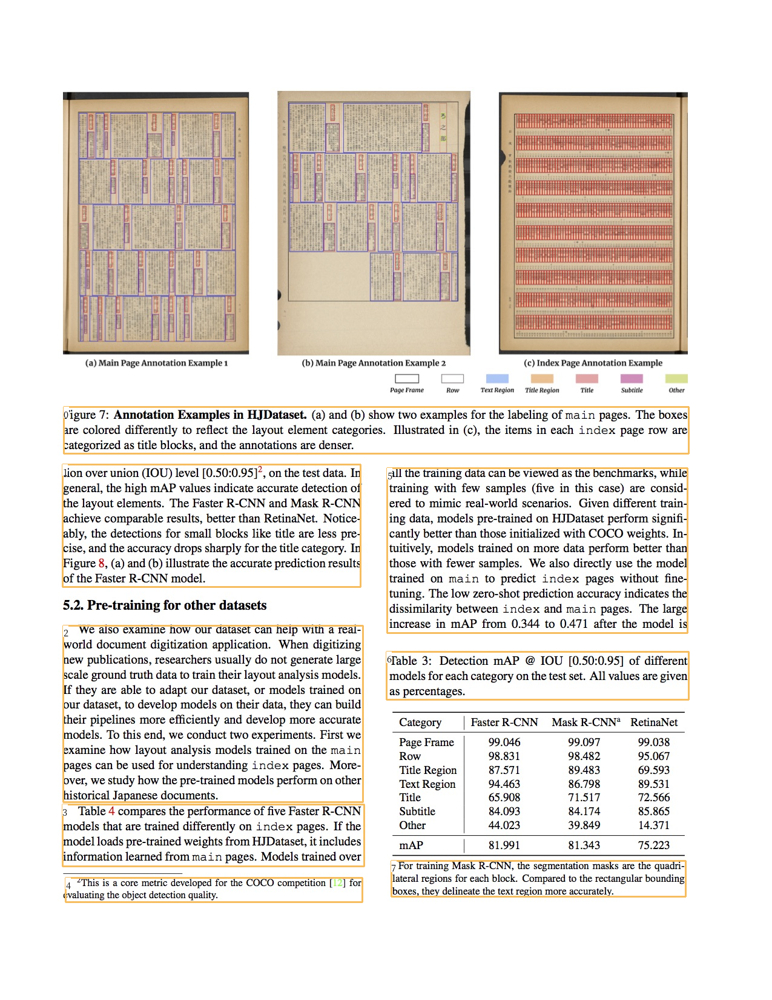

In [20]:
text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

print(text_blocks._blocks)

lp.draw_box(image, text_blocks,
            box_width=3,
            show_element_id=True)

## set up OCR

In [21]:
ocr_agent = lp.TesseractAgent(languages='eng')

# lp.is_paddle_available()
# ocr_agent = lp.paddleocr_agent(languages='eng')

# ocr_agent = lp.GCVAgent.with_credential("<path/to/your/credential>", languages = ['en', 'ko'])

## read in texts & put in block.text object (of text_blocks)

In [22]:
for block in text_blocks:
    segment_image = (block
                       .pad(left=5, right=5, top=5, bottom=5)
                       .crop_image(image))
        # add padding in each image segment can help improve robustness

    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)

In [23]:
for txt in text_blocks.get_texts():
    print(txt, end='\n---\n')

Figure 7: Annotation Examples in HJDataset. (a) and (b) show two examples for the labeling of main pages. The boxes
are colored differently to reflect the layout element categories. Illustrated in (c), the items in each index page row are
categorized as title blocks, and the annotations are denser.

---
tion over union (IOU) level [0.50:0.95]’, on the test data. In
general, the high mAP values indicate accurate detection of
the layout elements. The Faster R-CNN and Mask R-CNN
achieve comparable results, better than RetinaNet. Notice-
ably, the detections for small blocks like title are less pre-
cise, and the accuracy drops sharply for the title category. In
Figure 8, (a) and (b) illustrate the accurate prediction results
of the Faster R-CNN model.

---
We also examine how our dataset can help with
world document digitization application. When digitizing
new publications, researchers usually do not generate large
scale ground truth data to train their layout analysis models.
If they ar

In [24]:
text_blocks._blocks

[TextBlock(block=Rectangle(x_1=105.43914794921875, y_1=671.7182006835938, x_2=1137.5936279296875, y_2=748.4442138671875), text=Figure 7: Annotation Examples in HJDataset. (a) and (b) show two examples for the labeling of main pages. The boxes
 are colored differently to reflect the layout element categories. Illustrated in (c), the items in each index page row are
 categorized as title blocks, and the annotations are denser.
 , id=0, type=Text, parent=None, next=None, score=0.9950841069221497),
 TextBlock(block=Rectangle(x_1=103.88938903808594, y_1=766.864990234375, x_2=595.5885009765625, y_2=968.8319702148438), text=tion over union (IOU) level [0.50:0.95]’, on the test data. In
 general, the high mAP values indicate accurate detection of
 the layout elements. The Faster R-CNN and Mask R-CNN
 achieve comparable results, better than RetinaNet. Notice-
 ably, the detections for small blocks like title are less pre-
 cise, and the accuracy drops sharply for the title category. In
 Figure 

## display figure blocks

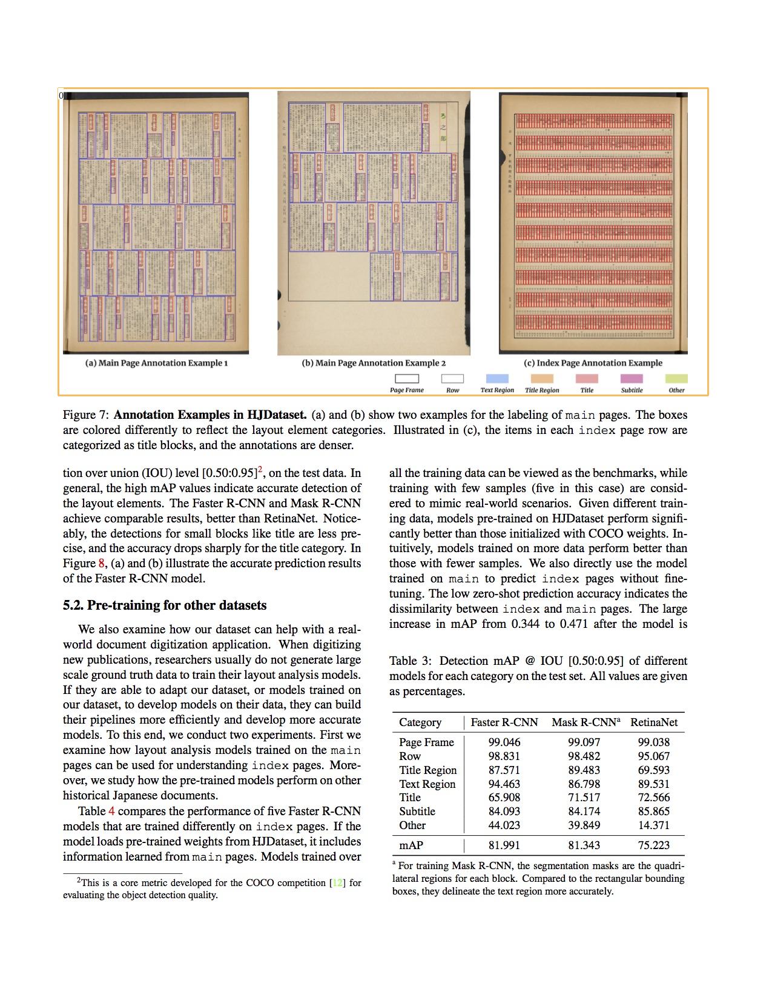

In [25]:
lp.draw_box(image, figure_blocks,
            box_width=3,
            show_element_id=True)

In [26]:
dir(figure_blocks)

['__abstractmethods__',
 '__add__',
 '__class__',
 '__class_getitem__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_blocks',
 'append',
 'clear',
 'condition_on',
 'copy',
 'count',
 'crop_image',
 'extend',
 'filter_by',
 'get_homogeneous_blocks',
 'get_info',
 'get_texts',
 'index',
 'insert',
 'is_in',
 'pad',
 'page_data',
 'pop',
 'relative_to',
 'remove',
 'reverse',
 'scale',
 'shift',
 'sort',
 'to_dataframe',
 'to_dict']

## sort figure_blocks by upper-left coordinate

In [27]:
figure_blocks = figure_blocks.sort(key = lambda b:b.coordinates[1])  

## crop image blocks from figure_blocks and 1) assign figure index 2) save as file w/ index as figure name

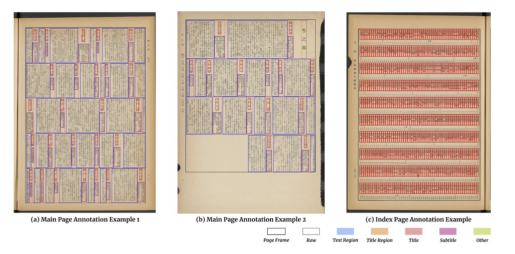

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline

# cropped_images = {}
for idx, block in enumerate(figure_blocks):   

    block.set(id=idx, inplace=True) 
    # cropped_images[idx] = block.crop_image(image)
        
    plt.imshow(block.crop_image(image))
    plt.axis('off')
    plt.savefig('image_' + str(idx) + '.png', bbox_inches='tight')    
    
# plt.imshow(figure_blocks.crop_image(image)[0])  # this crops all image blocks from image

In [29]:
block

TextBlock(block=Rectangle(x_1=96.58174896240234, y_1=145.02035522460938, x_2=1169.68408203125, y_2=652.1997680664062), text=None, id=0, type=Figure, parent=None, next=None, score=0.9950384497642517)

In [30]:
figure_blocks.to_dict()

{'page_data': {},
 'blocks': [{'x_1': 96.58174896240234,
   'y_1': 145.02035522460938,
   'x_2': 1169.68408203125,
   'y_2': 652.1997680664062,
   'block_type': 'rectangle',
   'id': 0,
   'type': 'Figure',
   'score': 0.9950384497642517}]}

## determine locations of figure blocks in document

In [31]:
# pass (for court cases)

## put everything in dictionary, in order of upper left coordinate

In [32]:
all_blocks = text_blocks + figure_blocks
all_blocks = all_blocks.sort(key = lambda b:b.coordinates[1])

all_blocks.to_dict()

{'page_data': {},
 'blocks': [{'x_1': 96.58174896240234,
   'y_1': 145.02035522460938,
   'x_2': 1169.68408203125,
   'y_2': 652.1997680664062,
   'block_type': 'rectangle',
   'id': 0,
   'type': 'Figure',
   'score': 0.9950384497642517},
  {'x_1': 105.43914794921875,
   'y_1': 671.7182006835938,
   'x_2': 1137.5936279296875,
   'y_2': 748.4442138671875,
   'block_type': 'rectangle',
   'text': 'Figure 7: Annotation Examples in HJDataset. (a) and (b) show two examples for the labeling of main pages. The boxes\nare colored differently to reflect the layout element categories. Illustrated in (c), the items in each index page row are\ncategorized as title blocks, and the annotations are denser.\n',
   'id': 0,
   'type': 'Text',
   'score': 0.9950841069221497},
  {'x_1': 103.88938903808594,
   'y_1': 766.864990234375,
   'x_2': 595.5885009765625,
   'y_2': 968.8319702148438,
   'block_type': 'rectangle',
   'text': 'tion over union (IOU) level [0.50:0.95]’, on the test data. In\ngeneral,

## convert to better-structured key-value pair

In [33]:
dict_block = {}
for idx, item in enumerate(all_blocks):
        
    entry = {}
    entry['coordiates'] = item.coordinates    
    entry['type'] = item.type
    if item.type == 'Text':
        entry['text'] = item.text
        entry['text_id'] = item.id
    if item.type == 'Figure':
        entry['filename'] = 'image_' + str(item.id) + '.png'
        entry['figure_id'] = item.id
    dict_block[idx] = entry
dict_block

{0: {'coordiates': (96.58174896240234,
   145.02035522460938,
   1169.68408203125,
   652.1997680664062),
  'type': 'Figure',
  'filename': 'image_0.png',
  'figure_id': 0},
 1: {'coordiates': (105.43914794921875,
   671.7182006835938,
   1137.5936279296875,
   748.4442138671875),
  'type': 'Text',
  'text': 'Figure 7: Annotation Examples in HJDataset. (a) and (b) show two examples for the labeling of main pages. The boxes\nare colored differently to reflect the layout element categories. Illustrated in (c), the items in each index page row are\ncategorized as title blocks, and the annotations are denser.\n',
  'text_id': 0},
 2: {'coordiates': (103.88938903808594,
   766.864990234375,
   595.5885009765625,
   968.8319702148438),
  'type': 'Text',
  'text': 'tion over union (IOU) level [0.50:0.95]’, on the test data. In\ngeneral, the high mAP values indicate accurate detection of\nthe layout elements. The Faster R-CNN and Mask R-CNN\nachieve comparable results, better than RetinaNet. N

# 2. Reconstruct in HTML (ignore formatting)

## 2-0. alt 0: using Dominate

In [ ]:
import dominate
from dominate.tags import *

doc = dominate.document(title='PDf to HTML tester')

with doc.head:    
    meta(charset="utf-8")
    link(rel='stylesheet', href='style.css')   

with doc:
    with div(id='header').add(ol()):
        for i in ['home', 'about', 'contact']:
            li(a(i.title(), href='/%s.html' % i))

    with div():
        attr(cls='body')
        p('Lorem ipsum..')

print(doc)

## 2-1. alt 1: hard code HTML

In [ ]:
html = f'''
    <!DOCTYPE html>
    <html lang="ko">
    </html>
    '''
# 3. Write the html string as an HTML file
with open('html_report.html', 'w') as f:
    f.write(html)

## 2-2. alt 2: using HTML template (= hard code)

In [ ]:
# 1. Create a template file as report_template.html

from jinja2 import Environment, FileSystemLoader

# 2. Create a template Environment
env = Environment(loader=FileSystemLoader('templates'))

# 3. Load the template from the Environment
template = env.get_template('report_template.html')

# 4. Render the template with variables
html = template.render(page_title_text='My report',
                       title_text='Daily S&P 500 prices report',
                       text ='Hello, welcome to your report!',
                       prices_text='Historical prices of S&P 500',
                       stats_text='Historical prices summary statistics',
                       sp500_history=sp500_history,
                       sp500_history_summary=sp500_history_summary)

# 5. Write the template to an HTML file
with open('html_report_jinja.html', 'w') as f:
    f.write(html)

# <html>
#     <head>
#         <title>{{page_title_text}}</title>
#     </head>
#     <body>
#             <h1>{{title_text}}</h1>
#             <p>{{text}}</p>
#             <img src='chart.png' width="700">
#             <h2>{{prices_text}}</h2>
#             {{sp500_history.tail(3).to_html()}}
#             <h2>{{stats_text}}</h2>
#             {{sp500_history_summary.to_html()}}
#     </body>
# </html>

## 2-3. other alts: (https://blog.finxter.com/generating-html-documents-in-python/)
- airium (can also translate html to Python: from_html_to_airium)
- yattag

# 3. Reconstruct HTML (maintain formatting)